**Week 1: Data Cleaning**

# Task 1: Data Importing and Initial Exploration

In [1]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Import the dataset using Pandas
energy_df = pd.read_csv("smart_home_energy_consumption.csv")
energy_df.head(3)

,Date,Home_ID,City,Energy_Consumption_kWh,Occupancy,Temperature_C,Humidity_%,HVAC_Usage_kWh,Kitchen_Usage_kWh,Electronics_Usage_kWh
0,2024-03-14 06:00:00,Home_8,Lucknow,3.14,1,25.71,46.10,1.12,0.97,0.38
1,2024-04-06 06:00:00,Home_9,Hyderabad,4.70,1,27.73,45.42,0.54,1.45,0.30
2,2024-01-30 13:00:00,Home_4,Lucknow,2.27,0,16.20,57.50,-0.22,0.21,0.26


**Occupancy  column  is  binary  type.**

In [3]:
# Explore the dataset by checking the structure, data types
summary_df = pd.DataFrame({
    'Column': energy_df.columns,
    'Non-Null Count': energy_df.notnull().sum().values,
    'Dtype': energy_df.dtypes.values
})

# Apply styling
styled_summary = (
    summary_df.style
    .background_gradient(subset=['Non-Null Count'], cmap='YlGn')
    .set_properties(**{'text-align': 'center'})
    .set_table_styles(
        [{'selector': 'th', 'props': [('text-align', 'center')]}]
    )
    .format({'Non-Null Count': "{:,}"})
)

# Display the styled DataFrame
styled_summary

,Column,Non-Null Count,Dtype
0,Date,"2,500",object
1,Home_ID,"2,500",object
2,City,"2,500",object
3,Energy_Consumption_kWh,"2,450",float64
4,Occupancy,"2,500",int64
5,Temperature_C,"2,450",float64
6,Humidity_%,"2,450",float64
7,HVAC_Usage_kWh,"2,450",float64
8,Kitchen_Usage_kWh,"2,500",float64
9,Electronics_Usage_kWh,"2,500",float64


**Missing  value  columns:**

**1. Energy_Consumption_kWh <br>  2. Temperature_C	<br>3. Humidity_%  <br>4. HVAC_Usage_kWh**

In [4]:
# statistics of numerical columns
describe_df = energy_df.describe()

# Apply styling to the describe DataFrame
styled_describe = (
    describe_df.style
    .background_gradient(cmap='Blues')  # Adds a gradient background to emphasize values
    .highlight_min(color='red', axis=1)  # Highlights the minimum values in each column in red
    .highlight_max(color='green', axis=1)  # Highlights the maximum values in each column in green
    .set_properties(**{'text-align': 'center'})  # Center the text in all cells
    .set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])  # Center the header text
    .format("{:.2f}")  # Format numbers to 2 decimal places
)

# Display the styled DataFrame
styled_describe

,Energy_Consumption_kWh,Occupancy,Temperature_C,Humidity_%,HVAC_Usage_kWh,Kitchen_Usage_kWh,Electronics_Usage_kWh
count,2450.00,2500.00,2450.00,2450.00,2450.00,2500.00,2500.00
mean,3.52,0.70,23.95,59.88,1.01,0.80,0.51
std,1.37,0.46,5.25,14.79,0.51,0.41,0.30
min,-0.67,0.00,7.26,8.19,-1.03,-0.65,-0.56
25%,2.68,0.00,20.43,49.73,0.67,0.52,0.31
50%,3.50,1.00,23.91,59.66,1.02,0.81,0.51
75%,4.31,1.00,27.45,69.77,1.36,1.08,0.71
max,33.48,1.00,49.14,113.16,2.55,2.31,1.57


**In  all  type  of  "energy  consumption  columns"    values  can't  be  negetive** 

# Task 2: Handling Missing Data

As&nbsp; the&nbsp; dataset&nbsp; only&nbsp; contain&nbsp; 2500&nbsp; rows.<br>
we&nbsp; can&nbsp; use&nbsp; median&nbsp; values&nbsp; to&nbsp; fill&nbsp; missing&nbsp; datapoints.
<br>
<br>
There&nbsp; is&nbsp; no&nbsp; need&nbsp; for&nbsp; home&nbsp; id column...so&nbsp; removing&nbsp; it.
<br>
Changing&nbsp; negetive&nbsp; values&nbsp; in&nbsp; the&nbsp; energy&nbsp; columns&nbsp; with&nbsp; column's&nbsp; median

In [5]:
columns_to_modify = ['Energy_Consumption_kWh', 'HVAC_Usage_kWh', 'Kitchen_Usage_kWh', 'Electronics_Usage_kWh']

# Compute the median for each column
medians = energy_df[columns_to_modify].median()

# Replace negative values with the median of the respective column
for column in columns_to_modify:
    energy_df.loc[energy_df[column] < 0, column] = medians[column]

**adding missing values**

In [6]:
df = energy_df.fillna(energy_df.median())

C:\Users\saura\AppData\Local\Temp\ipykernel_10064\3667405182.py:1: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df = energy_df.fillna(energy_df.median())


In [7]:
df.drop(['Home_ID'],axis=1,inplace=True)

# Task 3: Outlier Detection and Handling


In [8]:
df.City.value_counts()

Lucknow      277
Hyderabad    267
Kolkata      263
Jaipur       255
Pune         253
Ahmedabad    252
Bangalore    251
Chennai      232
Delhi        226
Mumbai       224
Name: City, dtype: int64

we&nbsp; can&nbsp; ignore&nbsp; maximum&nbsp; temp.&nbsp; in&nbsp; these&nbsp; cities<br>
Minimum&nbsp; temp.&nbsp; should&nbsp; be&nbsp; observe&nbsp; wisely.

In [9]:
columns_to_check = ['Humidity_%', 'Temperature_C']

# Function to detect and cap outliers based on IQR
def handle_outliers_iqr(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Calculate bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 5.5 * IQR
        
        # Cap outliers
        df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)
        
    return df

# Handle outliers for the specified columns
df_cleaned = handle_outliers_iqr(df, columns_to_check)

# Task 4: Time-Series Consistency

In [10]:
# Convert 'Date' column to datetime
df_cleaned['Date'] = pd.to_datetime(df['Date'])

# Check for duplicate timestamps
duplicates = df[df.duplicated(subset='Date', keep=False)]

# Handle duplicates by aggregating (taking the mean) or removing
df_aggregated = df_cleaned.groupby('Date').agg({
    'Energy_Consumption_kWh': 'mean'
}).reset_index()

# Sort the DataFrame by date
df_sorted = df_aggregated.sort_values(by='Date').reset_index(drop=True)


# Task 5: Data Normalization

**This step should be part of ML model building<br> As it covenient to use in model pipeline** 

**Week 2: Exploratory Data Analysis (EDA) & Visualization**

# Task 1: Univariate Analysis

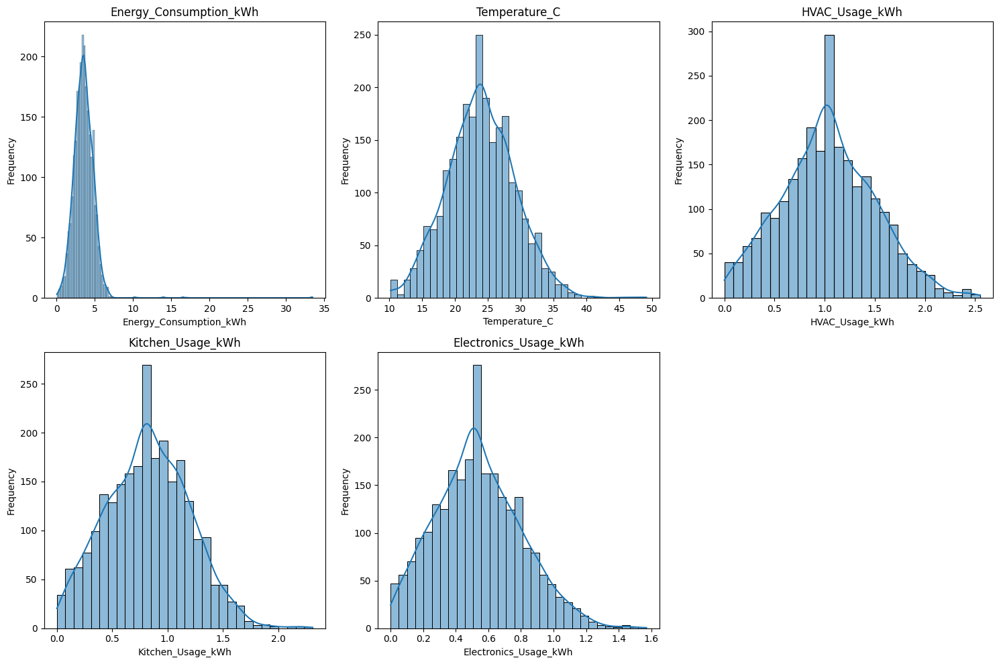

In [11]:
# Distribution of each  values
plt.figure(figsize=(15, 10))
# List of features to plot
features = ['Energy_Consumption_kWh', 'Temperature_C', 'HVAC_Usage_kWh', 'Kitchen_Usage_kWh', 'Electronics_Usage_kWh']
# Plotting histograms for each feature
for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    sns.histplot(df[feature], kde=True)
    plt.title(f'{feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

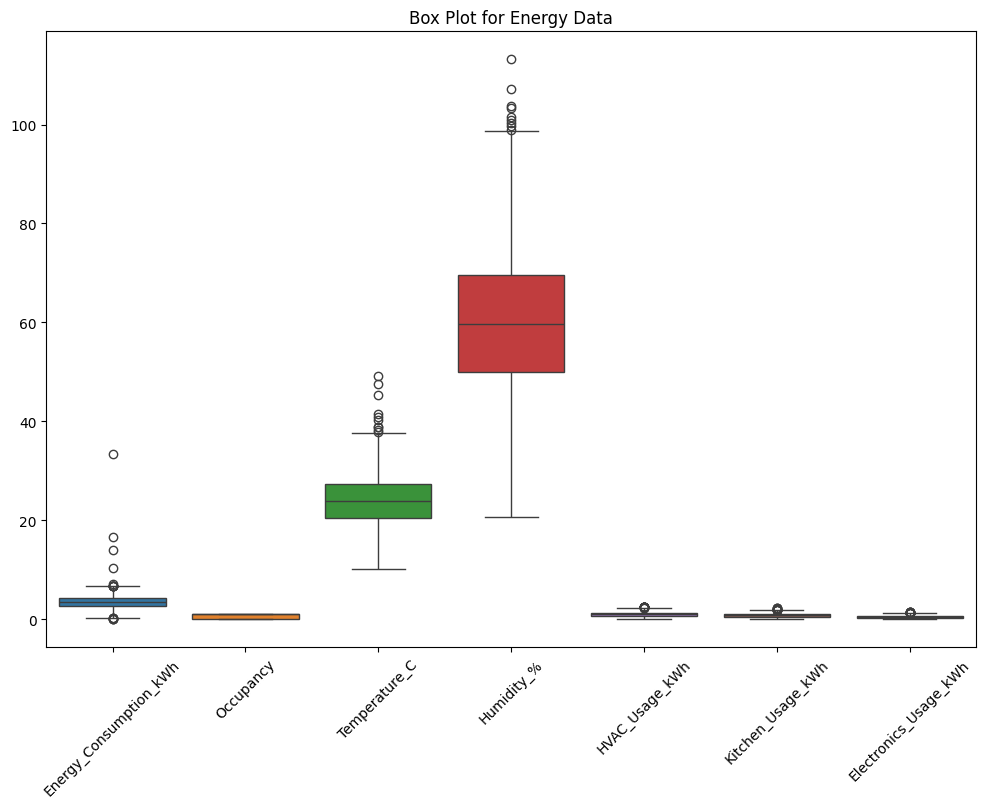

In [12]:
# Plotting box plots for each numeric column
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[['Energy_Consumption_kWh', 'Occupancy', 'Temperature_C', 
                            'Humidity_%', 'HVAC_Usage_kWh', 'Kitchen_Usage_kWh', 
                            'Electronics_Usage_kWh']])
plt.xticks(rotation=45)
plt.title("Box Plot for Energy Data")
plt.show()

# Task 2: Bivariate and Multivariate Analysis

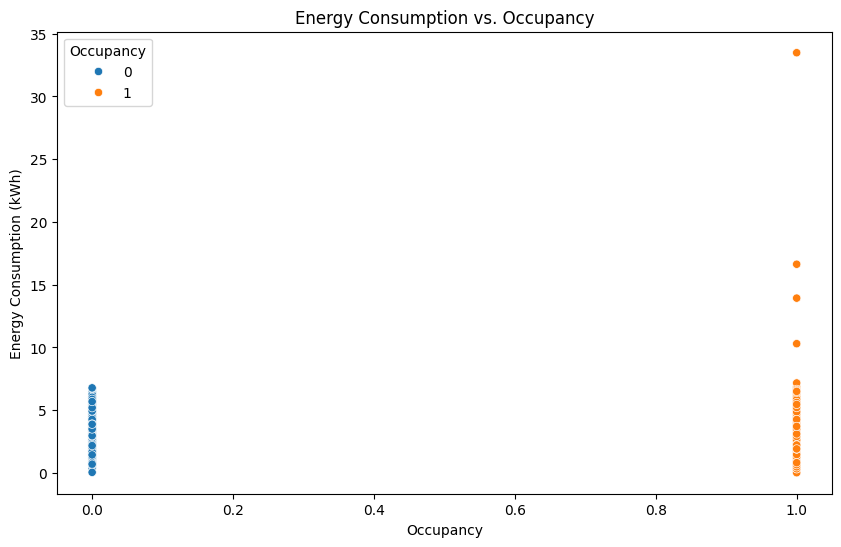

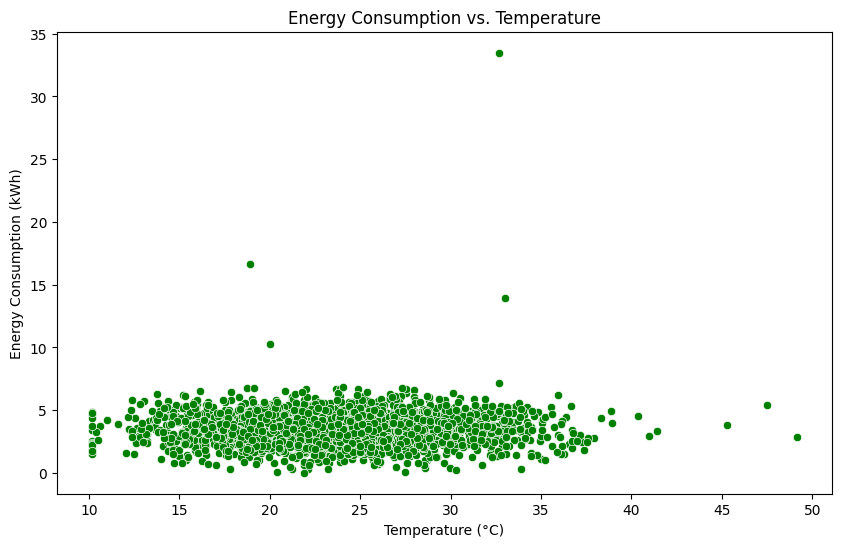

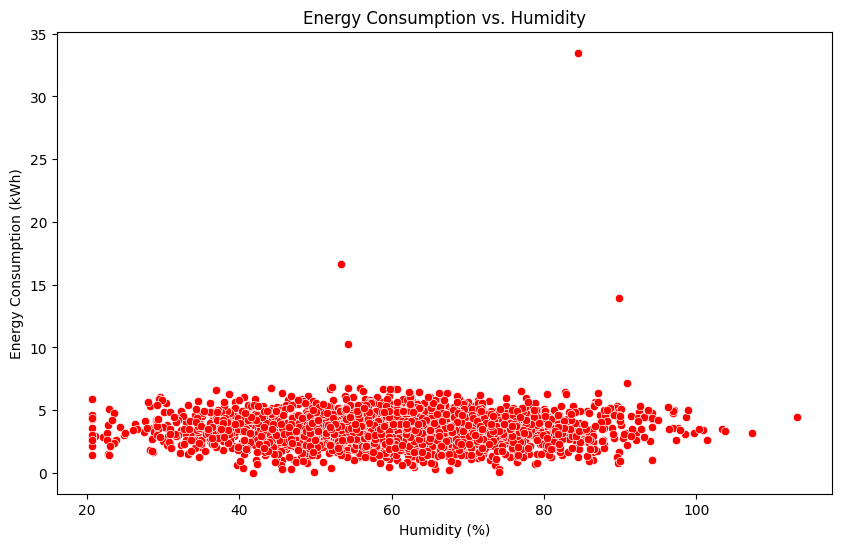

In [13]:
# Scatter plot for Energy Consumption vs. Occupancy
from turtle import color


plt.figure(figsize=(10, 6))
sns.scatterplot(x='Occupancy', y='Energy_Consumption_kWh', data=df_cleaned,hue='Occupancy')
plt.title('Energy Consumption vs. Occupancy')
plt.xlabel('Occupancy')
plt.ylabel('Energy Consumption (kWh)')
plt.show()

# Scatter plot for Energy Consumption vs. Temperature
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature_C', y='Energy_Consumption_kWh', data=df_cleaned,color='Green')
plt.title('Energy Consumption vs. Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('Energy Consumption (kWh)')
plt.show()

# Scatter plot for Energy Consumption vs. Humidity
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Humidity_%', y='Energy_Consumption_kWh', data=df_cleaned,color='Red')
plt.title('Energy Consumption vs. Humidity')
plt.xlabel('Humidity (%)')
plt.ylabel('Energy Consumption (kWh)')
plt.show()

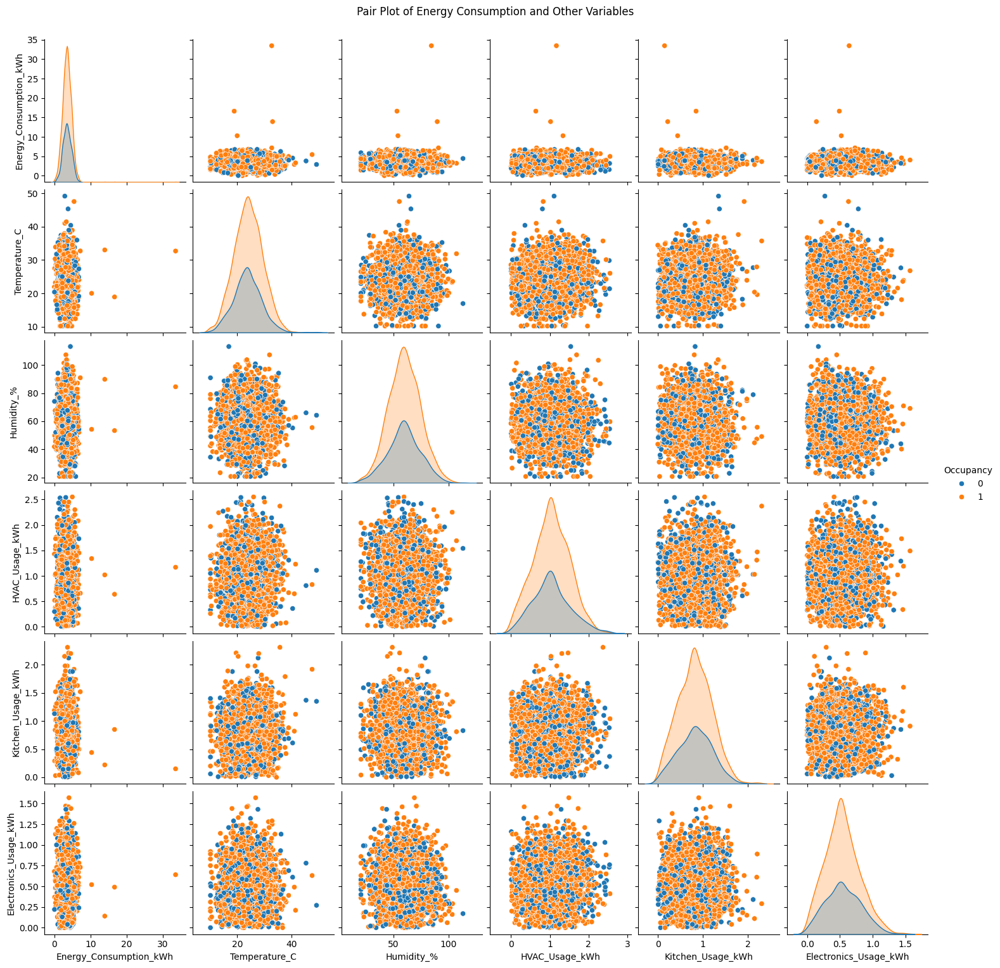

In [14]:
# Pair plot to visualize relationships between all variables
sns.pairplot(df_cleaned,hue='Occupancy')
plt.suptitle('Pair Plot of Energy Consumption and Other Variables', y=1.02)
plt.show()


# Task 3: Time-Series Analysis

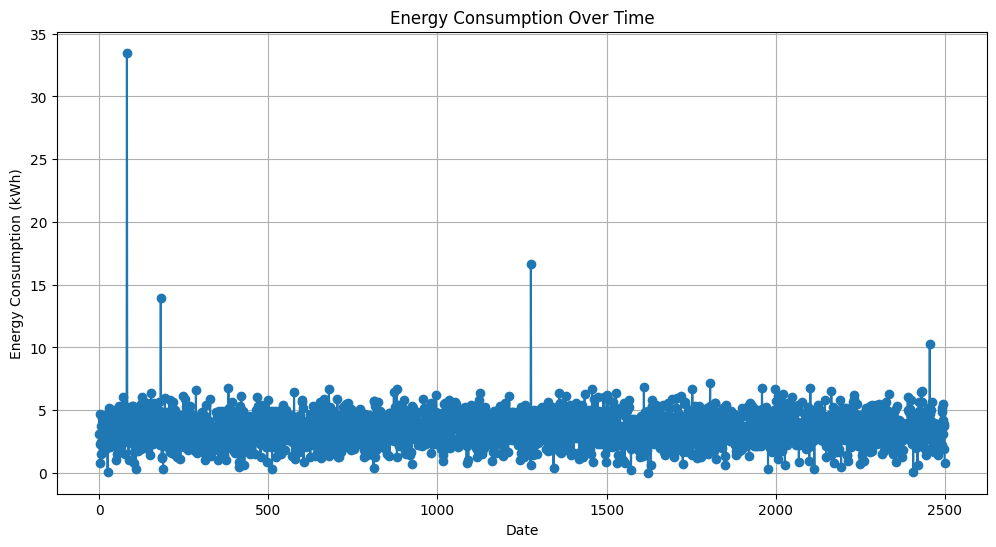

In [15]:
# Line plot to visualize energy consumption trends over time
plt.figure(figsize=(12, 6))
plt.plot(df_cleaned.index, df_cleaned['Energy_Consumption_kWh'], marker='o')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kWh)')
plt.grid(True)
plt.show()

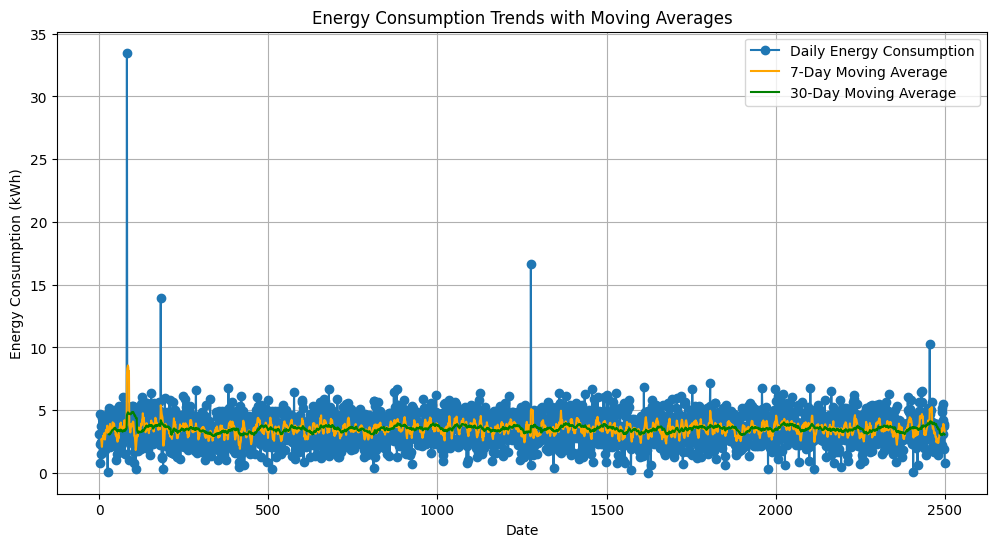

In [16]:
# Calculate moving averages
df_cleaned['7_day_MA'] = df_cleaned['Energy_Consumption_kWh'].rolling(window=7).mean()
df_cleaned['30_day_MA'] = df_cleaned['Energy_Consumption_kWh'].rolling(window=30).mean()

# Plot energy consumption with moving averages
plt.figure(figsize=(12, 6))
plt.plot(df_cleaned.index, df['Energy_Consumption_kWh'], label='Daily Energy Consumption', marker='o')
plt.plot(df_cleaned.index, df['7_day_MA'], label='7-Day Moving Average', color='orange')
plt.plot(df_cleaned.index, df['30_day_MA'], label='30-Day Moving Average', color='green')
plt.title('Energy Consumption Trends with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kWh)')
plt.legend()
plt.grid(True)
plt.show()


**From this visualization we can easily say in between 3 months there is linearity in energy consumption** 

1. But in "Daily consumption" the energy consumption band gap is approx "8" kwh

2. There are some extream energy consumtions...Mainly that signifies factories or Festival usage

3. in 30 day span energy consumption is on and average maintain linearity

4. there is slight(high) energy usage change in 3rd to 4th month (march-->april)

more or less here every city has consumtion under 30 kwh

# Task 4: Feature Engineering

In [18]:
# creating new features from existing features

# Calculate Energy_per_Occupant_kWh only for rows where Occupancy is 1 or greater
df_cleaned['Energy_per_Occupant_kWh'] = df_cleaned['Energy_Consumption_kWh'] / df_cleaned['Occupancy']
df_cleaned.loc[df_cleaned['Occupancy'] == 0, 'Energy_per_Occupant_kWh'] = 0

# Calculate the mean temperature
mean_temperature = df_cleaned['Temperature_C'].mean()

# Create the Temperature Difference feature
df_cleaned['Temperature_Difference_C'] = (df_cleaned['Temperature_C'] - mean_temperature).abs()

# Sample the DataFrame to see the changes
df_cleaned.sample()


,Date,City,Energy_Consumption_kWh,Occupancy,Temperature_C,Humidity_%,HVAC_Usage_kWh,Kitchen_Usage_kWh,Electronics_Usage_kWh,7_day_MA,30_day_MA,Energy_per_Occupant_kWh,Temperature_Difference_C
171,2024-01-08 17:00:00,Bangalore,4.82,0,26.8,57.87,1.29,0.75,0.28,3.96,3.781667,0.0,2.84542


**These new features are perfectly allign with the all other features**

C:\Users\saura\AppData\Local\Temp\ipykernel_10064\3244083867.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_cleaned.corr()


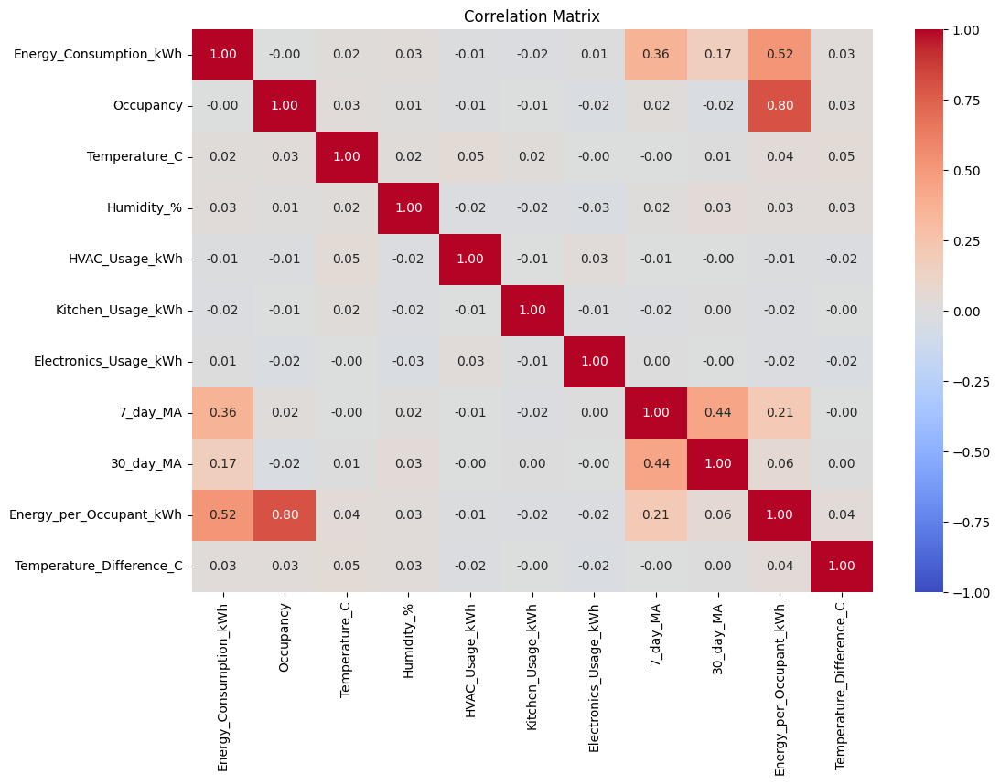

In [19]:
# Calculate the correlation matrix
correlation_matrix = df_cleaned.corr()

# Plot the correlation matrix heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Task 5: Advanced Visualizations

In [20]:
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode(connected=False)
# Set Plotly to work offline
pyo.init_notebook_mode(connected=False)

# Create an interactive scatter plot
trace = go.Scatter(
    x=df_cleaned['Energy_Consumption_kWh'],
    y=df_cleaned['Temperature_C'],
    mode='markers',
    marker=dict(size=10, color='rgba(255, 182, 193, .9)', line=dict(width=2, color='rgba(255, 182, 193, .9)')),
    text=df.index
)

layout = go.Layout(
    title='Energy Consumption vs Temperature',
    xaxis=dict(title='Energy Consumption (kWh)'),
    yaxis=dict(title='Temperature (°C)')
)

fig = go.Figure(data=[trace], layout=layout)

# Plot the figure offline
pyo.iplot(fig)

To visualize the distribution of a dataset and its probability density

In [21]:
# Create an interactive violin plot
trace = go.Violin(
    y=df['Energy_Consumption_kWh'],
    x=df['Temperature_C'],
    box_visible=True,
    line_color='rgba(255, 182, 193, .9)',
    fillcolor='rgba(255, 182, 193, .5)',
    marker=dict(color='rgba(255, 182, 193, .9)'),
)

layout = go.Layout(
    title='Energy Consumption Distribution by Temperature',
    xaxis=dict(title='Temperature (°C)'),
    yaxis=dict(title='Energy Consumption (kWh)')
)

fig = go.Figure(data=[trace], layout=layout)

# Plot the figure offline
pyo.iplot(fig)


# Exploratory Data Analysis (EDA) Summary
3. Data Transformation<br>
Energy Consumption per Occupant: Calculated by dividing Energy_Consumption_kWh by Occupancy.<br> Set to 0 where Occupancy is 0.
Temperature Difference: Calculated as the absolute difference between Temperature_C and the mean temperature.<br><br>
4. Univariate Analysis<br>
Histograms and Box Plots: Revealed the distribution of key features:
Energy Consumption shows a right-skewed distribution with a few extreme high values.<br>
Temperature has a wider range with variability across different records.<br><br>
5. Bivariate Analysis<br>
Scatter Plots:<br>

Energy Consumption vs. Temperature: Positive correlation, indicating that higher temperatures might be associated with increased energy consumption.<br>
Energy Consumption vs. Occupancy: Higher occupancy generally leads to higher energy consumption.<br><br>
Correlation Matrix:<br><br>

Positive Correlation: Notable correlations between Energy_Consumption_kWh and HVAC_Usage_kWh, Kitchen_Usage_kWh.<br>
Negative or Low Correlation: Correlations with Humidity_% were less pronounced.<br><br>
6. Advanced Visualizations<br>
Joint Plots: Provided insights into the relationship between Energy_Consumption_kWh and Temperature_C.<br>
Violin Plots: Illustrated the distribution of energy consumption across different temperature ranges.<br>
Interactive Plots: Enabled detailed exploration of data points and distributions.<br><br>
7. Trends Over Time<br>
Time Series Analysis: Revealed daily and weekly patterns in energy consumption.<br>
Seasonality: Identified variations in energy consumption corresponding to different times of the day and week.<br><br>
8. City-wise Analysis<br>
Energy Consumption by City: Analyzed variations in energy consumption across different cities to understand regional differences.<br><br>
Conclusions<br>
Energy Consumption Trends: Higher temperatures and occupancy levels generally lead to increased energy consumption.<br>
Feature Importance: Features like HVAC_Usage_kWh, Kitchen_Usage_kWh, and Temperature_C have significant correlations with energy consumption.<br>
Data Quality: Some features had negative values or outliers, indicating potential data quality issues that may need addressing.<br>


***Week 3: Machine Learning***

# Task 1: Data Splitting

1. before splitting the dataset  we have to select the target column( Y ).
2. and rest of the features are for X vector points.
3. here Energy_Consumption_kWh	is our target column/predictive column.

In [22]:
df_cleaned['Date'] = pd.to_datetime(df['Date'])  # Ensure 'Date' column is in datetime format
df = df_cleaned.sort_values('Date')  # Sort the data based on time to maintain sequential order

# Splitting the data into 80% training and 20% testing
split_ratio = 0.8
split_index = int(len(df) * split_ratio)

train_data = df_cleaned[:split_index]  # First 80% for training
test_data = df_cleaned[split_index:]   # Remaining 20% for testing

In [23]:
x_train = train_data.drop(['Date', 'City', 'Energy_Consumption_kWh'],axis=1) 
y_train = train_data['Energy_Consumption_kWh']
x_test = test_data.drop(['Date', 'City', 'Energy_Consumption_kWh'],axis=1) 
y_test = test_data['Energy_Consumption_kWh']

# Task 2: Model Selection and Training

In [54]:
import pandas as pd
from sklearn.linear_model import ElasticNet

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor  
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score

# Example: Assuming train_data and test_data are pre-loaded DataFrames

# Features to be scaled (excluding 'Occupancy' as it is binary)
numeric_features = ['Temperature_C', 'Humidity_%', 'HVAC_Usage_kWh', 
                    'Kitchen_Usage_kWh', 'Electronics_Usage_kWh', '7_day_MA', '30_day_MA']
binary_features = ['Occupancy']  # Binary feature that should remain unscaled

# Define imputation strategies for different types of features
numeric_imputer = SimpleImputer(strategy='mean')  # You can use 'median' or other strategies if needed
# Define a column transformer
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline(steps=[
        ('imputer', numeric_imputer),  # Handle missing values for numeric features
        ('scaler', StandardScaler())  # Standardize numeric features
    ]), numeric_features), 
    ('bin', 'passthrough', binary_features)  # Pass through binary features without scaling
])

elastic_net = ElasticNet(alpha=0.05, l1_ratio=0.07, random_state=42)
# Define the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', elastic_net)  # Apply linear regression
])


# Fit the pipeline to the training data
pipeline.fit(x_train, y_train)

# Make predictions
y_pred = pipeline.predict(x_test)



# Task 3: Model Evaluation

In [55]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse**0.5  # Square root of MSE
r2 = r2_score(y_test, y_pred)

# Fancy output
print("\nModel Evaluation Metrics:")
print("-" * 30)
print(f"Mean Absolute Error (MAE)    : {mae:,.2f}")
print(f"Mean Squared Error (MSE)     : {mse:,.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:,.2f}")
print(f"R-squared (R²)               : {r2:.4f}")
print("-" * 30)



Model Evaluation Metrics:
------------------------------
Mean Absolute Error (MAE)    : 0.87
Mean Squared Error (MSE)     : 1.24
Root Mean Squared Error (RMSE): 1.11
R-squared (R²)               : 0.1480
------------------------------


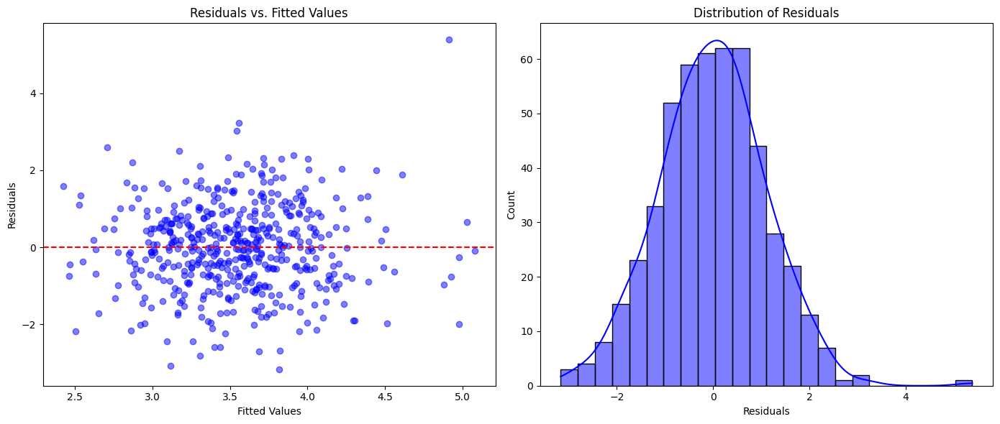

In [56]:
# Calculate residuals
residuals = y_test - y_pred

# Plot Residuals vs. Fitted Values
plt.figure(figsize=(14, 6))

# Residuals vs. Fitted
plt.subplot(1, 2, 1)
plt.scatter(y_pred, residuals, alpha=0.5, color='blue')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')

# Histogram of Residuals
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True, color='blue')
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')

plt.tight_layout()
plt.show()

1. Residuals vs. Fitted Values (Left Plot):<br>
Interpretation: The residuals are scattered around zero, with no clear pattern, suggesting that the model has captured the general relationship between predictors and the target variable well.<br>
Insights:<br>
Homoscedasticity: The spread of residuals appears roughly consistent across the range of fitted values, which suggests that the assumption of homoscedasticity (constant variance of errors) holds.<br>
No Clear Pattern: The residuals do not seem to exhibit any specific trends, such as increasing or decreasing with fitted values, which indicates that the model likely does not suffer from bias or misspecification.<br>
Potential Outliers: A few points lie farther from the zero line (especially in the upper right corner), which could indicate potential outliers or areas where the model underperforms.<br><br><br>
2. Distribution of Residuals (Right Plot):
Interpretation: The histogram of residuals looks close to a normal distribution, with a slight skew toward positive residuals.<br>
Insights:<br>
Normality: The residuals appear to follow a nearly normal distribution, as suggested by the bell-shaped curve, with the majority of residuals clustered around zero.<br> This is a good sign for the validity of the model, as many modeling techniques assume normally distributed residuals.<br>
Skewness: There might be a slight positive skew (more positive residuals), suggesting the model tends to slightly underestimate the target variable for some data points.<br>
Overall Model Assessment:<br>
Good Fit: The residuals show no apparent patterns, and the histogram indicates a close-to-normal distribution, suggesting that the model is reasonably well-fitted to the data.<br>
Minor Issues: The slight skew and potential outliers might indicate areas where the model could be improved, such as handling outliers more robustly or experimenting with different model specifications.<br>
If you'd like to dig deeper into specific areas, like identifying outliers or testing further model assumptions, let me know!<br>

# Task 4: Feature Importance and Interpretation

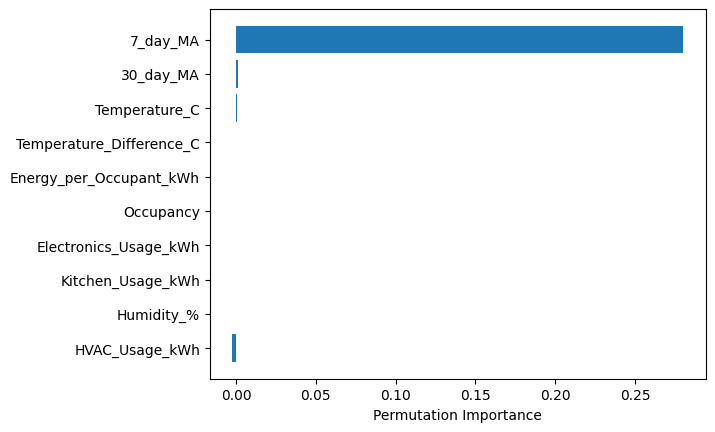

In [57]:
from sklearn.inspection import permutation_importance

# Assuming you have a fitted model and test set
result = permutation_importance(pipeline, x_test, y_test, n_repeats=10, random_state=42)

# Sort by importance
sorted_idx = result.importances_mean.argsort()

plt.barh(x_test.columns[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
plt.show()


# Task 5: Predictive System and Testing

In [58]:
# Create a DataFrame to compare actual vs predicted
comparison = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(comparison.head())

      Actual  Predicted
2000    3.28   4.132059
2001    5.71   4.389753
2002    3.48   4.287430
2003    3.42   4.139612
2004    3.44   4.018343


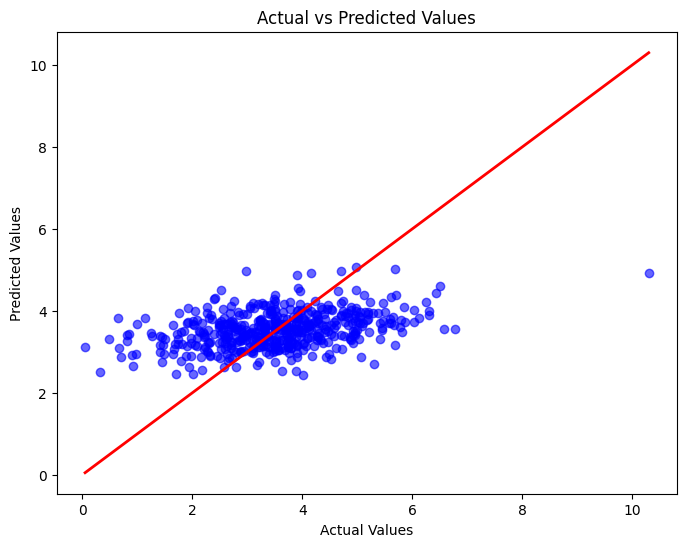

In [59]:
import matplotlib.pyplot as plt

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.6)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2)  # Reference line y=x
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()
